In [ ]:
!pip install -q lpips
!pip install -q datasets kornia torchmetrics torchvision safetensors huggingface_hub opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 52.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 119.9 MB/s eta 0:00:00


In [ ]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

from torch.utils.data import Dataset, DataLoader
from datasets import load_dataset
from kornia.color import rgb_to_lab, lab_to_rgb
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure, MeanAbsoluteError
import lpips


import glob
from zipfile import ZipFile

import torchmetrics
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

import lpips
from torchmetrics import MeanAbsoluteError

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

Using device: cuda


Download Landscape Dataset

In [ ]:

DS_PATH = './dataset/landscape-pictures'
COLOR_PATH = os.path.join(DS_PATH, 'color')
os.makedirs(DS_PATH, exist_ok=True)

!curl -L "https://www.kaggle.com/api/v1/datasets/download/arnaud58/landscape-pictures" -o ./dataset/landscape-pictures.zip

with ZipFile('./dataset/landscape-pictures.zip', 'r') as zip_ref:
    zip_ref.extractall(DS_PATH)

os.makedirs(COLOR_PATH, exist_ok=True)
for f in sorted(glob.glob(os.path.join(DS_PATH, '*.jpg'))):
    new_path = os.path.join(COLOR_PATH, os.path.basename(f))
    if not os.path.exists(new_path):
        os.rename(f, new_path)




# Dataset split
color_files = sorted(glob.glob(os.path.join(COLOR_PATH, '*.jpg')))
np.random.seed(42)
np.random.shuffle(color_files)

MAX_SAMPLES = 2500
color_files = color_files[:MAX_SAMPLES]

train_files = color_files[:1750]
val_files   = color_files[1750:2125]
test_files  = color_files[2125:2500]

print(f"Train: {len(train_files)}, Val: {len(val_files)}, Test: {len(test_files)}")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  620M  100  620M    0     0  21.5M      0  0:00:28  0:00:28 --:--:-- 22.3M
Train: 1750, Val: 375, Test: 375


In [ ]:
class LandscapeDataset(Dataset):
    def __init__(self, file_list, target_size=(224, 224), ab_scale=0.5):
        self.file_list = file_list
        self.target_size = target_size
        self.ab_scale = ab_scale

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        img = cv2.imread(self.file_list[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, self.target_size)
        img = img.astype(np.float32) / 255.0

        # Convert to Lab
        lab = rgb_to_lab(torch.tensor(img).permute(2, 0, 1).unsqueeze(0)).squeeze(0)
        L = lab[0:1] / 100.0          # [0,1]
        ab = lab[1:3] / 128.0 * self.ab_scale  # scaled ab

        return L.float(), ab.float()

# Use same input size as pretrained model (likely 224x224)
TARGET_SIZE = (224, 224)
AB_SCALE = 0.5
BATCH_SIZE = 8

train_ds = LandscapeDataset(train_files, TARGET_SIZE, AB_SCALE)
val_ds   = LandscapeDataset(val_files, TARGET_SIZE, AB_SCALE)
test_ds  = LandscapeDataset(test_files, TARGET_SIZE, AB_SCALE)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [ ]:
def visualize_image(model, dataset, idx, device=DEVICE):
    model.eval()
    plt.figure(figsize=(12, 4))

    with torch.no_grad():
        L, ab = dataset[idx]
        L = L.unsqueeze(0).to(device)
        ab = ab.unsqueeze(0).to(device)

        pred_ab = model(L)

        # Lab reconstruction (CORRECT)
        lab_pred = torch.cat([
            L * 100.0,
            pred_ab * (128.0 / AB_SCALE)
        ], dim=1)

        lab_gt = torch.cat([
            L * 100.0,
            ab * (128.0 / AB_SCALE)
        ], dim=1)

        rgb_pred = lab_to_rgb(lab_pred).squeeze(0).permute(1, 2, 0).cpu().numpy()
        rgb_gt   = lab_to_rgb(lab_gt).squeeze(0).permute(1, 2, 0).cpu().numpy()
        L_gray   = L.squeeze().cpu().numpy()

        plt.subplot(1, 3, 1)
        plt.imshow(L_gray, cmap="gray")
        plt.title(f"Input L (idx={idx})")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(np.clip(rgb_pred, 0, 1))
        plt.title("Predicted")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(np.clip(rgb_gt, 0, 1))
        plt.title("Ground Truth")
        plt.axis("off")

    plt.show()

In [ ]:
class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 64, 3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 32, 3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(32, 2, 3, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

In [ ]:
def init_weights(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_normal_(m.weight)
        if m.bias is not None:
            nn.init.zeros_(m.bias)

model = SimpleCNN().to(DEVICE)
model.apply(init_weights)

SimpleCNN(
  (net): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(32, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): Tanh()
  )
)

In [ ]:
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(DEVICE)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(DEVICE)

patience = 15
best_val_loss = float("inf")
patience_counter = 0

train_losses, val_losses = [], []
psnr_vals, ssim_vals = [], []

In [ ]:
criterion = nn.SmoothL1Loss()

# Metrics
psnr_metric = PeakSignalNoiseRatio().to(DEVICE)
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(DEVICE)

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)

mae_metric = MeanAbsoluteError().to(DEVICE)

# LPIPS
lpips_metric = lpips.LPIPS(net='alex').to(DEVICE)
lpips_metric.eval()

def delta_e(rgb1, rgb2):
    """
    Compute mean Delta E (CIE76) between two RGB images
    """
    lab1 = rgb_to_lab(rgb1)
    lab2 = rgb_to_lab(rgb2)
    return torch.mean(torch.sqrt(torch.sum((lab1 - lab2) ** 2, dim=1)))

HEIGHT, WIDTH = 224, 224  # smaller for faster training/debugging
BATCH_SIZE = 8
EPOCHS = 150
LR = 1e-4

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 142MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth


In [ ]:
for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0

    for L, ab in train_loader:
        L, ab = L.to(DEVICE), ab.to(DEVICE)

        optimizer.zero_grad()
        pred_ab = model(L)
        loss = criterion(pred_ab, ab)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    model.eval()
    val_loss = 0.0
    psnr_metric.reset()
    ssim_metric.reset()

    with torch.no_grad():
        for L, ab in val_loader:
            L, ab = L.to(DEVICE), ab.to(DEVICE)
            pred_ab = model(L)

            # Loss
            val_loss += criterion(pred_ab, ab).item()

            # LAB → RGB
            lab_pred = torch.cat([L * 100.0, pred_ab * 128.0], dim=1)
            lab_gt   = torch.cat([L * 100.0, ab * 128.0], dim=1)

            rgb_pred = lab_to_rgb(lab_pred).clamp(0, 1)
            rgb_gt   = lab_to_rgb(lab_gt).clamp(0, 1)

            # Metrics
            psnr_metric.update(rgb_pred, rgb_gt)
            ssim_metric.update(rgb_pred, rgb_gt)

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    psnr_val = psnr_metric.compute().item()
    ssim_val = ssim_metric.compute().item()

    psnr_vals.append(psnr_val)
    ssim_vals.append(ssim_val)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"PSNR: {psnr_val:.2f} | "
        f"SSIM: {ssim_val:.4f}"
    )

    # Early Stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "best_model.pth")
        print("✅ Best model saved")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("⏹️ Early stopping triggered")
            break

Epoch [1/150] | Train Loss: 0.0041 | Val Loss: 0.0028 | PSNR: 34.32 | SSIM: 0.9303
✅ Best model saved
Epoch [2/150] | Train Loss: 0.0025 | Val Loss: 0.0022 | PSNR: 35.52 | SSIM: 0.9523
✅ Best model saved
Epoch [3/150] | Train Loss: 0.0023 | Val Loss: 0.0022 | PSNR: 35.40 | SSIM: 0.9615
Epoch [4/150] | Train Loss: 0.0022 | Val Loss: 0.0020 | PSNR: 35.88 | SSIM: 0.9648
✅ Best model saved
Epoch [5/150] | Train Loss: 0.0022 | Val Loss: 0.0027 | PSNR: 34.21 | SSIM: 0.9652
Epoch [6/150] | Train Loss: 0.0021 | Val Loss: 0.0023 | PSNR: 35.14 | SSIM: 0.9688
Epoch [7/150] | Train Loss: 0.0020 | Val Loss: 0.0018 | PSNR: 36.39 | SSIM: 0.9716
✅ Best model saved
Epoch [8/150] | Train Loss: 0.0020 | Val Loss: 0.0018 | PSNR: 36.37 | SSIM: 0.9725
✅ Best model saved
Epoch [9/150] | Train Loss: 0.0020 | Val Loss: 0.0018 | PSNR: 36.52 | SSIM: 0.9723
✅ Best model saved
Epoch [10/150] | Train Loss: 0.0020 | Val Loss: 0.0018 | PSNR: 36.36 | SSIM: 0.9733
Epoch [11/150] | Train Loss: 0.0019 | Val Loss: 0.0017 

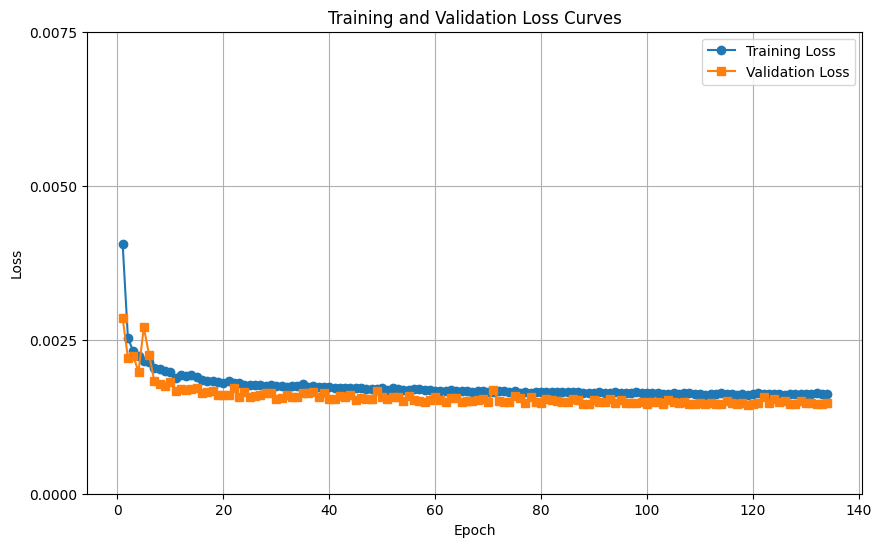

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_loss_curves(train_losses, val_losses, save_path=None):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_losses, label="Training Loss", marker='o')
    plt.plot(epochs, val_losses, label="Validation Loss", marker='s')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss Curves")
    plt.legend()
    plt.grid(True)

    y_ticks = np.arange(0, 0.009, 0.0025)
    plt.yticks(y_ticks)

    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()

# Usage
plot_loss_curves(train_losses, val_losses, save_path="loss_curve.png")

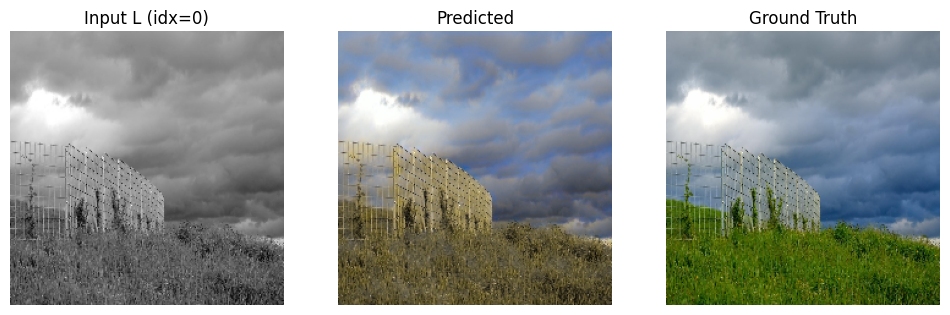

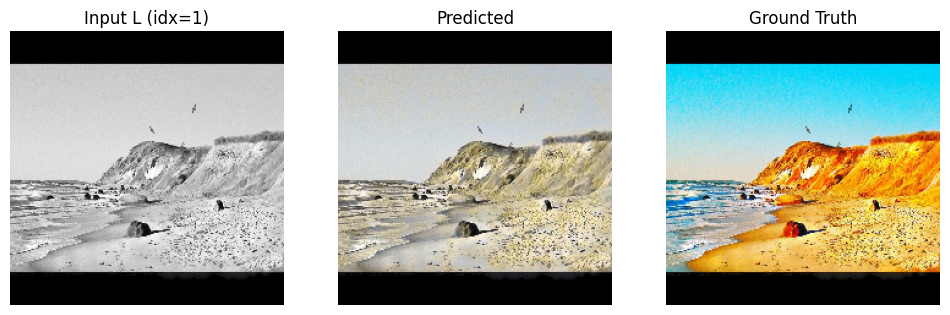

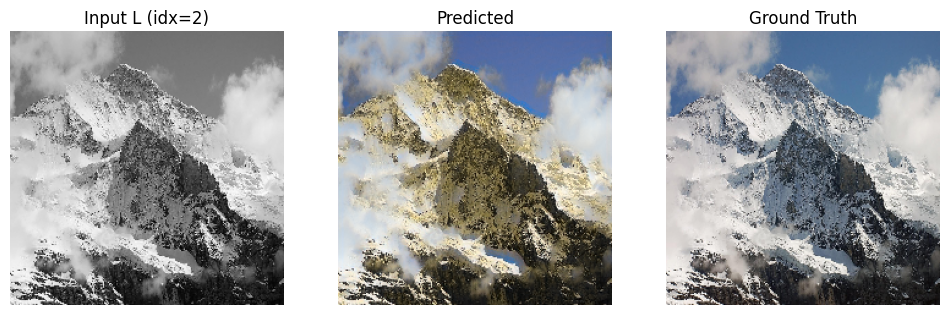

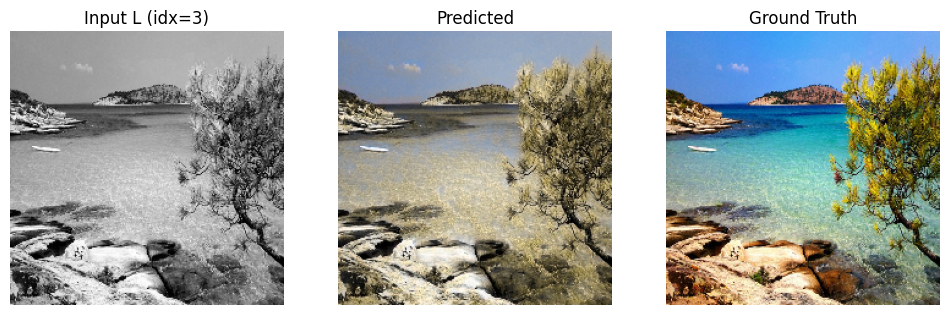

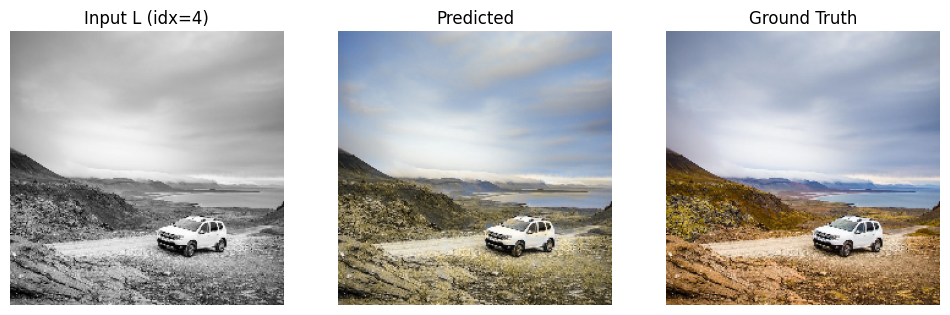

...

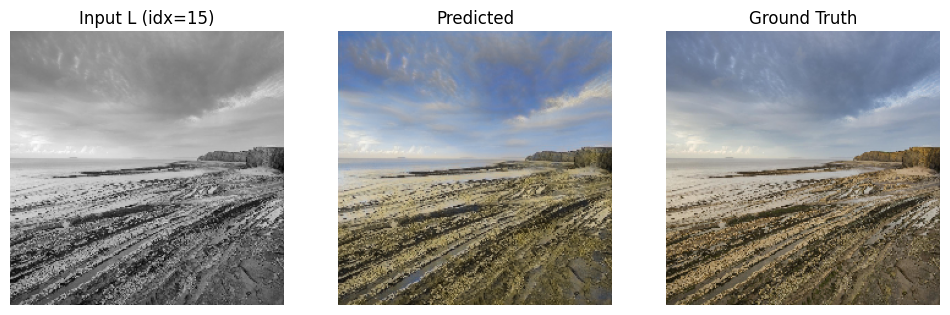

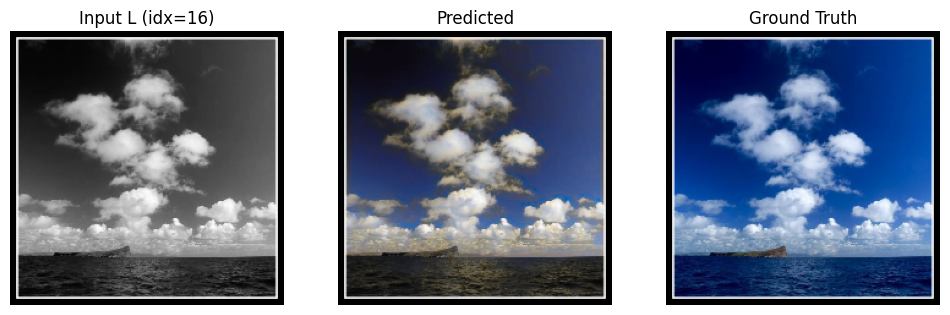

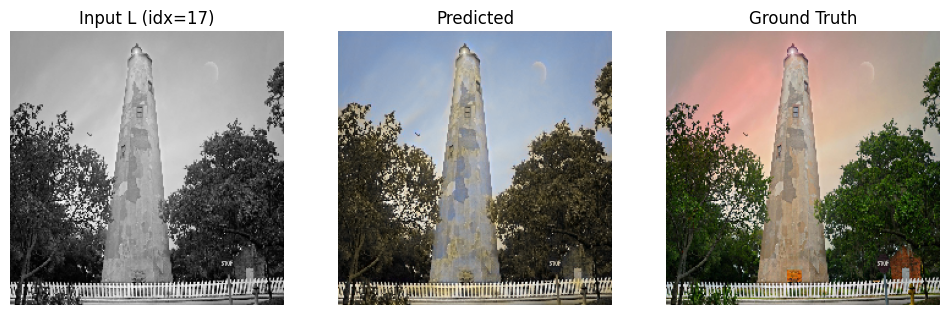

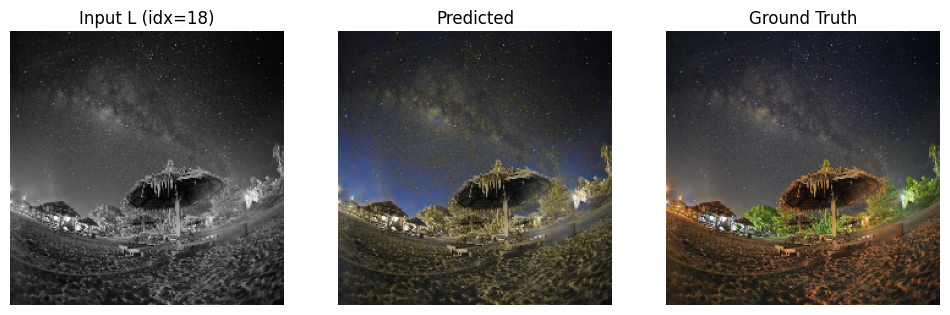

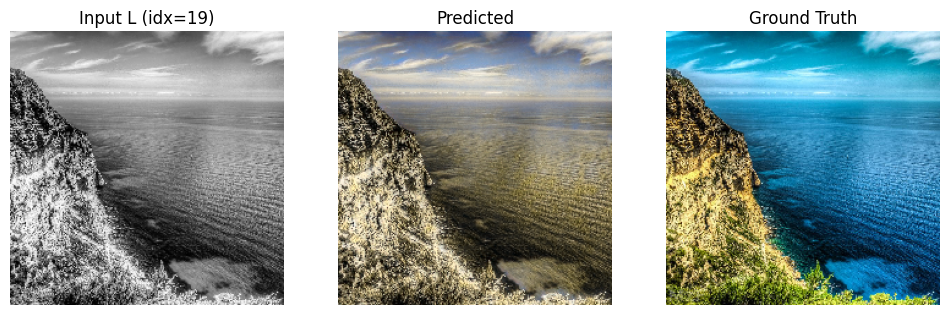

In [ ]:
for i in range(20):
  visualize_image(model, val_ds, i)

In [ ]:
def test_model(model, test_loader, device=DEVICE):
    model.eval()

    #Metrics
    psnr_metric = PeakSignalNoiseRatio().to(device)
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
    mae_metric  = MeanAbsoluteError().to(device)

    psnr_metric.reset()
    ssim_metric.reset()
    mae_metric.reset()

    # LPIPS
    lpips_metric = lpips.LPIPS(net='alex').to(device)
    lpips_metric.eval()

    lpips_score = 0.0
    delta_e_score = 0.0
    n_samples = 0

    with torch.no_grad():
        for L, ab in test_loader:
            L, ab = L.to(device), ab.to(device)
            pred_ab = model(L)

            # Lab reconstruction
            lab_pred = torch.cat([L * 100.0, pred_ab * (128.0 / AB_SCALE)], dim=1)
            lab_gt   = torch.cat([L * 100.0, ab * (128.0 / AB_SCALE)], dim=1)

            # RGB conversion
            rgb_pred = lab_to_rgb(lab_pred).clamp(0, 1)
            rgb_gt   = lab_to_rgb(lab_gt).clamp(0, 1)

            batch_size = L.size(0)
            n_samples += batch_size

            # Update metrics
            psnr_metric.update(rgb_pred, rgb_gt)
            ssim_metric.update(rgb_pred, rgb_gt)
            mae_metric.update(rgb_pred, rgb_gt)

            # LPIPS expects [-1, 1]
            lpips_score += lpips_metric(
                rgb_pred * 2 - 1,
                rgb_gt * 2 - 1
            ).sum().item()

            # ΔE (perceptual color difference)
            delta_e_score += delta_e(rgb_pred, rgb_gt).item() * batch_size

    print("✅ Test Results:")
    print(f"PSNR  : {psnr_metric.compute():.2f}")
    print(f"SSIM  : {ssim_metric.compute():.4f}")
    print(f"MAE   : {mae_metric.compute():.4f}")
    print(f"LPIPS : {lpips_score / n_samples:.4f}")
    print(f"ΔE    : {delta_e_score / n_samples:.2f}")

In [ ]:
test_model(model, test_loader, device=DEVICE)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth
✅ Test Results:
PSNR  : 30.18
SSIM  : 0.9027
MAE   : 0.0563
LPIPS : 0.1914
ΔE    : 15.43


In [ ]:
for i in range(50):
  visualize_image(model, test_ds, i)

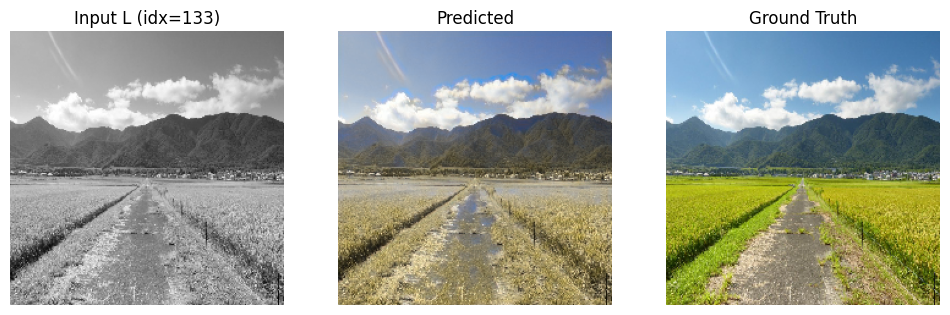

In [ ]:
visualize_image(model, test_ds, 133)

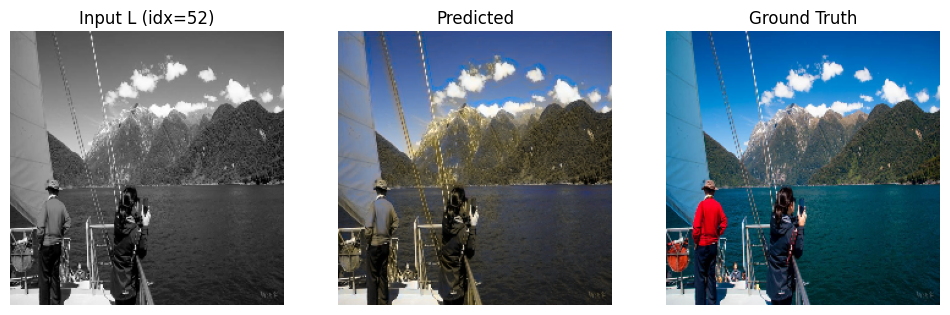

In [ ]:
visualize_image(model, test_ds, 52)

In [ ]:
full_model_path = "/content/colorization_full_model.pth"
torch.save(model, full_model_path)
print(f"✅ Entire model saved locally at: {full_model_path}")


✅ Entire model saved locally at: /content/colorization_full_model.pth
